In [14]:
# Step 1: Import required libraries
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.sparse import issparse

# For consistent plotting style
sns.set(style='white', context='notebook', rc={'figure.figsize': (12, 8)})

# Step 2: Define a function to preprocess scRNA-seq data
def preprocess_scrna_data(raw_counts):
    """
    Preprocess single-cell RNA sequencing data.
    Parameters:
    - raw_counts: 2D NumPy array or sparse matrix (cells x genes), raw count matrix.
    Returns:
    - log_data: Normalized and log-transformed matrix.
    """
    # Ensure the matrix is dense if sparse
    if issparse(raw_counts):
        raw_counts = raw_counts.toarray()

    # Normalize by total counts per cell (CPM normalization)
    total_counts = raw_counts.sum(axis=1, keepdims=True)  # Sum across genes for each cell
    normalized_data = raw_counts / total_counts * 1e6

    # Log-transform the normalized data
    log_data = np.log1p(normalized_data)

    return log_data


# Step 3: Define a function to compute UMAP
def compute_umap(
    data_matrix: np.ndarray,
    n_neighbors: int = 15,
    min_dist: float = 0.5,
    n_components: int = 2,
    pca_components: int = 50,
    random_state: int = 42,
    n_epochs: int = None  # UMAP will decide optimal epochs if None
) -> np.ndarray:
    """
    Compute UMAP embedding after PCA reduction.

    Parameters:
    - data_matrix: 2D NumPy array or pandas DataFrame (cells x genes).
    - n_neighbors: Number of neighbors for UMAP.
    - min_dist: Minimum distance between points in the low-dimensional space.
    - n_components: Number of UMAP dimensions (output).
    - pca_components: Number of PCA components to retain for UMAP.
    - random_state: Random seed for reproducibility.
    - n_epochs: Number of iterations for UMAP optimization. If None, UMAP auto-selects.

    Returns:
    - embedding: UMAP-transformed data (2D or n_components-D array).
    """
    # Step 1: Standardize the data (mean = 0, variance = 1)
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data_matrix)

    # Step 2: Apply PCA to reduce dimensionality to the top `pca_components` components
    pca = PCA(n_components=pca_components, random_state=random_state)
    pca_data = pca.fit_transform(scaled_data)

    # Step 3: Apply UMAP to the PCA-reduced data
    reducer = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        random_state=random_state,
        n_epochs=n_epochs
    )
    embedding = reducer.fit_transform(pca_data)

    return embedding


# Step 4: Visualization function
# Step 4: Visualization function
def plot_umap(
    embedding: np.ndarray,
    labels: np.ndarray = None,
    title: str = 'UMAP Embedding',
    cmap: str = 'Spectral',
    point_size: int = 10,
    alpha: float = 0.7
):
    """
    Visualize the UMAP embedding in 2D.

    Parameters:
    - embedding: 2D array of UMAP-transformed data (n_samples x 2 or 3).
    - labels: Optional, 1D array of labels for coloring points (e.g., classes or clusters).
    - title: Title for the plot.
    - cmap: Colormap for visualization.
    - point_size: Size of the scatter plot points.
    - alpha: Transparency of the points.
    """
    if embedding.shape[1] < 2 or embedding.shape[1] > 3:
        raise ValueError("Embedding must be 2D or 3D for visualization.")

    plt.figure(figsize=(10, 8))

    if labels is not None:
        # Create a scatter plot with labels
        scatter = plt.scatter(
            embedding[:, 0],
            embedding[:, 1],
            c=labels,
            cmap=cmap,
            s=point_size,
            alpha=alpha
        )
        # Add a colorbar for label interpretation
        cbar = plt.colorbar(scatter)
        cbar.set_label('Labels', fontsize=12)
    else:
        # Plot without labels
        plt.scatter(
            embedding[:, 0],
            embedding[:, 1],
            s=point_size,
            alpha=alpha,
            color='blue'
        )

    # Set aspect, title, and labels
    plt.gca().set_aspect('equal', 'datalim')
    plt.title(title, fontsize=16)
    plt.xlabel("UMAP 1", fontsize=12)
    plt.ylabel("UMAP 2", fontsize=12)
    plt.tight_layout()
    plt.show()



In [15]:
import scanpy as sc

# Step 1: Load the data (10x h5)
adata = sc.read_10x_h5("C:\\Users\\selim\\Documents\\vs_code_workingdir\\scGeatoobox_addson\\UMAP_python\\sample_filtered_feature_bc_matrix.h5")
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

# Step 2: Annotate mitochondrial, ribosomal, and hemoglobin genes
# annotate the group of mitochondrial genes as "mt"
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)

# Step 3: Compute QC metrics
adata.var_names_make_unique()
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True, log1p=True)

# Step 4: Filter cells and genes based on minimum criteria
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :].copy()

# Step 5: Saving count data for later use
adata.layers["counts"] = adata.X.copy()

# Step 6: Normalize the data (already done using Scanpy methods)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# HVGs
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

# Step 7: Preprocess the data for custom UMAP
# Since scanpy has already log-transformed and normalized, we'll use adata.X or adata.raw.X.
# If you want to use the raw counts, you can pass adata.layers["counts"] directly
preprocessed_data = adata.layers["counts"]   # using .raw for unmodified data; can be changed to adata.X if needed

c:\Users\selim\.conda\envs\scanpy_env_311\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\Users\selim\.conda\envs\scanpy_env_311\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


c:\Users\selim\.conda\envs\scanpy_env_311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


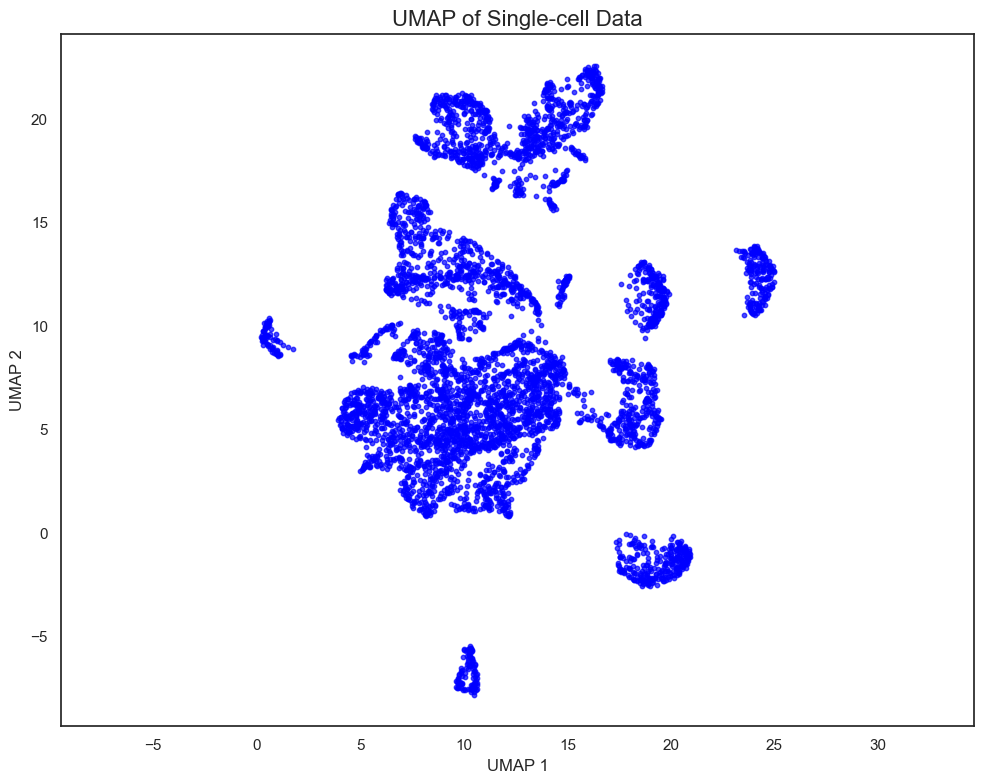

In [18]:
# Step 2: Preprocess the data
preprocessed_data = preprocess_scrna_data(adata.layers["counts"])
# Step 3: Compute UMAP
embedding = compute_umap(preprocessed_data)
# Step 4: Visualize the embedding
plot_umap(embedding, title="UMAP of Single-cell Data")

In [19]:
#sc.tl.pca(adata, n_comps=50, use_highly_variable=False, chunked=True, chunk_size=10000)
sc.tl.pca(adata, n_comps=50, use_highly_variable=False, chunked=False)
sc.pp.neighbors(adata, n_neighbors = 15, n_pcs= 50)
sc.tl.umap(adata, n_components=50)

c:\Users\selim\.conda\envs\scanpy_env_311\Lib\site-packages\scanpy\preprocessing\_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
c:\Users\selim\.conda\envs\scanpy_env_311\Lib\site-packages\umap\spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "numpy\\random\\mtrand.pyx", line 780, in numpy.random.mtrand.RandomState.randint
  File "numpy\\random\\_bounded_integers.pyx", line 1423, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "numpy\\random\\mtrand.pyx", line 780, in numpy.random.mtrand.RandomState.randint
  File "numpy\\random\\_bounded_integers.pyx", line 1423, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "numpy\\random\\mtrand.pyx", line 780, in numpy.random.mtrand.RandomState.randint
  File "numpy\\random\\_bounded_integers.pyx", line 1423, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (m

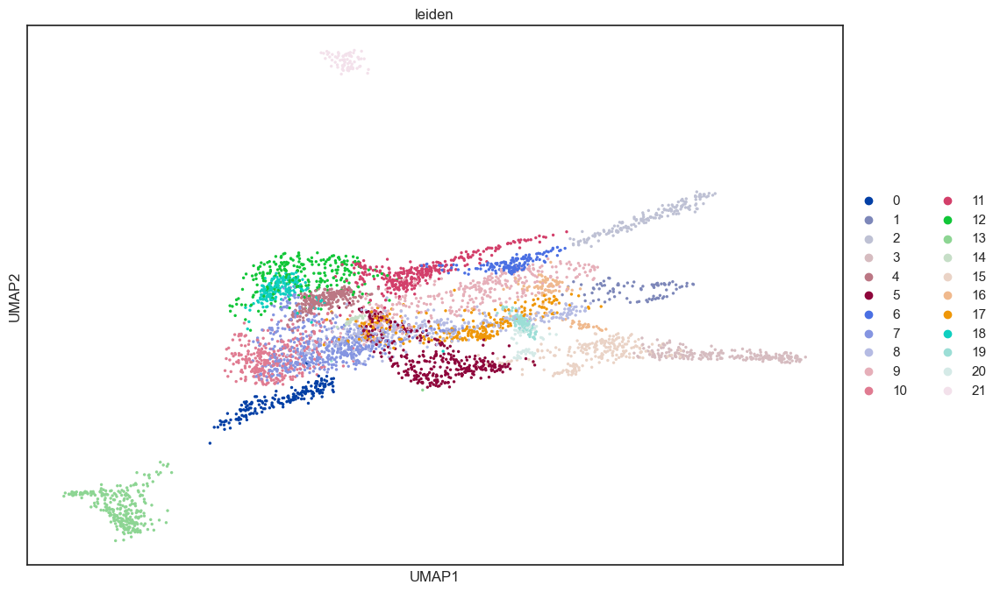

In [20]:
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)
# Step 11: Plot Scanpy's UMAP with Leiden clustering (or any other labels)
sc.pl.umap(adata, color=["leiden"])